# Capstone Project Module 2 : Data Analysis
# Airbnb Listings Bangkok
# Dibuat Oleh: Adeline Kartika Tiku Putri (JCDSOL-013 Kelas 02)

***

## Latar Belakang

Airbnb adalah platform penyewaan akomodasi jangka pendek yang populer, memungkinkan tuan rumah menyewakan properti mereka kepada tamu dari seluruh dunia. Sementara itu, para tamu dapat menemukan pilihan akomodasi yang lebih fleksibel, terjangkau, dan seringkali lebih personal daripada hotel tradisional. Dengan jutaan daftar di berbagai destinasi, Airbnb telah menjadi salah satu opsi populer bagi wisatawan yang mencari pengalaman menginap yang unik dan berbeda. Pada tahun 2023, Thailand menjadi destinasi paling banyak dikunjungi di Asia Tenggara di Airbnb, dengan jumlah malam menginap meningkat sebesar 60% dari tahun sebelumnya. Sumber: [bangkokpost](https://www.bangkokpost.com/business/general/2771814/airbnb-registers-focus-on-local-experiences). Di Bangkok, Airbnb saat ini sedang berkembang pesat dengan beragam properti seperti apartemen, vila, dan rumah tradisional. Harga bersaing dan keterlibatan lokal menjadi daya tariknya. Meski demikian, Airbnb dihadapkan pada tantangan regulasi.

Sebagai seorang *data analyst* yang sedang bekerja untuk sebuah perusahaan yang mengelola platform Airbnb di Bangkok, mereka ingin meningkatkan efektivitas dan kinerja platform Airbnb di Bangkok dengan memahami kondisi aktual platform serta menganalisis popularitas dan ketersediaan properti untuk mengoptimalkan strategi penyewaan dan meningkatkan pengalaman pengguna.

## Stakeholder
Ditujukan untuk perusahaan pemilik Platform Airbnb yang terdiri dari **tim data** dan **tim manajemen properti** dimana mereka tertarik untuk memahami kinerja platform Airbnb mereka saat ini guna meningkatkan pengalaman pengguna, mengoptimalkan fungsionalitas platform dan properti Airbnb di Bangkok.

## Pernyataan Masalah

**Tujuan utama adalah meningkatkan efektivitas dan kinerja platform Airbnb di Bangkok dengan memahami kondisi aktual platform serta menganalisis popularitas dan ketersediaan properti untuk mengoptimalkan startegi penyewaan dan meningkatkan pengalaman pengguna.**

Sebagai seorang *data analyst*, kita akan mencoba menjawab pertanyaan berikut:

1. Ketersediaan properti dan popularitas pengguna per daerah:
- Bagaimana pemetaan jumlah Airbnb berdasarkan daerah di Bangkok?
- Apa daerah yang paling populer di kalangan penyewa Airbnb?
- Apakah ada korelasi antara harga Airbnb dengan kepopuleran dari lokasi Airbnb?
2. Ketersediaan dan permintaan berdasarkan tipe kamar:
- Apa jenis kamar yang paling banyak tersedia di Airbnb Bangkok?
- Apa tipe kamar yang paling populer di kalangan penyewa Airbnb?
- Apakah ketersediaan kamar sudah memenuhi permintaan/kepopuleran pasar?
- Bagaimana pola harga Airbnb berdasarkan tipe kamar?
- Apakah ketersediaan kamar sudah memenuhi permintaan pasar, dan ada tidaknya perbedaan signifikan di antara tipe kamar?
3. Tentang Performa Host dan portfolio Host:
- Bagaimana efektivitas penggunaan platform Airbnb oleh host?
- Apa tren atau pola tertentu dalam penamaan Airbnb?



## Airbnb Dataset
Untuk menjawab pertanyaan di atas, kita akan menganalisis dataset Airbnb yang telah dikumpulkan oleh perusahaan yang mengoperasikan bisnis platform Airbnb di Bangkok. Dataset dapat diakses [di sini](https://drive.google.com/drive/folders/1A_KBMRFTS5Mthpp46nulso679ML4ZwTF). 

In [1]:
# Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind

# Map
import folium
from folium.plugins import MarkerCluster

import requests

# Words
import nltk # natural language toolkit
nltk.download('stopwords')
from nltk.corpus import stopwords
from collections import Counter # to count words in our list
from wordcloud import WordCloud, ImageColorGenerator

import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package stopwords to C:\Users\X1
[nltk_data]     Carbon\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Dataset ini berisi informasi demografis, harga dan ulasan dari daftar Airbnb di Bangkok. Ada 16 kolom di dalam dataset "Airbnb Listings Bangkok", yaitu:  

* id: ID unik untuk setiap Airbnb.
* name: Nama Airbnb.
* host_id: ID unik untuk setiap pemilik Airbnb.
* host_name: Nama pemilik Airbnb. Biasanya hanya terdiri dari nama depan.
* neighbourhood: Daerah lokasi Airbnb.
* latitude: Posisi Airbnb berdasarkan garis lintang menggunakan proyeksi Sistem Geodesi Dunia (WGS84).
* longitude: Posisi Airbnb berdasarkan garis bujur menggunakan proyeksi Sistem Geodesi Dunia (WGS84).
* room_type: Tipe kamar Airbnb. Terdapat 4 tipe yaitu, *entire home/apt*, *hotel room*, *private room*, dan *shared room*.
* price: Harga sewa Airbnb per hari berdasarkan mata uang lokal.
* minimum_nights: Jumlah minimum masa inap malam untuk Airbnb tersebut.
* number_of_reviews: Jumlah ulasan yang dimiliki.
* last_review: Tanggal ulasan terakhir/terbaru.
* reviews_per_month: Rata-rata jumlah pengguna yang memberikan ulasan per bulan.
* calculated_host_listings_count: Jumlah Airbnb yang dimiliki oleh pemilik Airbnb.
* availability_365: Ketersediaan Airbnb untuk 365 hari ke depan. 
* number_of_reviews_ltm: Jumlah ulasan yang dimiliki oleh Airbnb dalam 12 bulan terakhir.

Berikut 5 baris teratas dan terbawah dari dataset "Airbnb Listings Bangkok".

In [2]:
# Loading dataset
df = pd.read_csv("Airbnb Listings Bangkok.csv")

# Menampilkan 5 baris teratas dan terbawah dari dataset
display(df.head(),df.tail())

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0
15853,15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,NaN,NaN,14,365,0


### Data Understanding
Sebelum masuk ke dalam analisis, kita perlu mengenal dataset kita lebih mendalam dalam tahap *data understanding*. Dari proses ini, kita dapat mengidentifikasi anomali yang ada dalam dataset kita sehingga dapat ditangani dalam tahap *data cleaning*.

Pertama, mari kita lihat informasi umum dari dataset "Airbnb Listings Bangkok".

In [3]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (15854, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854

In [4]:
# Ringkasan statistik deskriptif untuk kolom numerik dan kolom objek dari dataset
display(df.describe(), df.describe(include='object'))

,Unnamed: 0,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,15854.000000,1.585400e+04,1.585400e+04,15854.000000,15854.000000,1.585400e+04,15854.000000,15854.000000,10064.000000,15854.000000,15854.000000,15854.000000
mean,7926.500000,1.579397e+17,1.541058e+08,13.745144,100.559903,3.217704e+03,15.292355,16.654157,0.813145,13.889618,244.378643,3.481519
std,4576.799919,2.946015e+17,1.318726e+08,0.043040,0.050911,2.497212e+04,50.815020,40.613331,1.090196,30.269848,125.843224,8.916937
min,0.000000,2.793400e+04,5.892000e+04,13.527300,100.329550,0.000000e+00,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,3963.250000,2.104509e+07,3.974431e+07,13.720090,100.529690,9.000000e+02,1.000000,0.000000,0.120000,1.000000,138.000000,0.000000
50%,7926.500000,3.503734e+07,1.224556e+08,13.738490,100.561415,1.429000e+03,1.000000,2.000000,0.435000,4.000000,309.000000,0.000000
75%,11889.750000,5.256154e+07,2.390547e+08,13.759497,100.585150,2.429000e+03,7.000000,13.000000,1.060000,13.000000,360.000000,3.000000
max,15853.000000,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,365.000000,325.000000


,name,host_name,neighbourhood,room_type,last_review
count,15846,15853,15854,15854,10064
unique,14794,5312,50,4,1669
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,2022-12-11
freq,45,228,2153,8912,189


In [5]:
# Mengatur agar dapat menampilkan seluruh isi kolom tanpa membantasi panjang kolom
pd.set_option('display.max_colwidth', None)

# Mengambil data unik di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

# Menampilkan informasi penting tentang jumlah nilai unik dan data unik dari setiap kolom
tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'], data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,Unnamed: 0,15854,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]"
1,id,15854,"[27934, 27979, 28745, 35780, 941865, 1704776, 48736, 1738669, 1744248, 952677, 55681, 1765918, 55686, 59221, 959254, 62217, 1791481, 66046, 105042, 1793000, 960858, 113744, 965722, 1808600, 118118, 1816517, 969792, 121410, 145343, 973830, 156583, 1823321, 159854, 976690, 978531, 166267, 169285, 978969, 1842066, 169514, 1849029, 1862089, 985743, 988373, 172332, 1016487, 1862331, 1862377, 185364, 1887544, 1888303, 1019241, 241416, 1026451, 1028469, 1028486, 1035589, 1035640, 1897982, 296960, 1898332, 1041976, 313459, 1052180, 1926489, 320014, 1933894, 1057173, 1060320, 384924, 1067748, 1077493, 1943048, 385130, 385278, 385979, 390611, 1947314, 1079039, 1086843, 393066, 397449, 405662, 1088343, 1094136, 1961981, 407381, 1975849, 1133843, 413824, 428360, 428421, 428907, 428950, 430691, 430703, 430706, 432004, 439051, 1138679, ...]"
2,name,14794,"[Nice room with superb city view, Easy going landlord,easy place, modern-style apartment in Bangkok, Spacious one bedroom at The Kris Condo Bldg. 3, Suite Room 3 at MetroPoint, NEw Pro!! Bungalow Bkk Centre, Condo with Chaopraya River View, 1 chic bedroom apartment in BKK, Batcave, Pool view, near Chatuchak, Standard Room Decor do Hostel, Sathorn Terrace Apartment(61), 2BR apt in a cozy neighborhood, Comfy bedroom near River pier & BTS Taksin., budget hotel bangkok near subway, Deluxe Condo, Nana, Pool/GYM/Sauna, Luxury@swimpool/FreeWiFi/nearJJMkt, Nice and Quiet condo near BTS Onnut, 24Flr- 1br Apt near JJ, MRT, BTS, Central Bangkok 3 Bedroom Apartment, The Duplex - Asoke- Luxury 92sqm, New, Stylish & Luxury Studio Condo, River View - Ivy Condo (1 Bedroom), Siamese Gioia on Sukhumvit 31, Contemporary Modern Duplex-Thong Lo, Pan Dao Condo 5 min from BTS On Nut, 1 BR condominium center BKK +NETFLIX+55SQM, 1 penthouse in central Bangkok, MetroPoint Suite Room, Near Airport, Boutique Rooms Near Bangkok Airport, BangLuang House1 @ Bangkok Thailand, Studio near Chula University/Silom walk to MRT/BTS, กรองทองแมนชั่น (ลาดพร้าว 81), Deluxe one Bedroom Condo w.Pool-GYM & Sauna 8-7, Beautiful 1 BR apartment @BTS Ari, Urban Oasis in the heart of Bangkok, 1Bed apt. near Chula University/Silom, Stay at the ROARING RATCHADA!, 60 m2 apartment in Thong Lor, Bangkok, ICONSIAM River view on 49th floor, 2br apt in Sukhumvit Asoke near BTS, Self catering cozy1-bed near BTS, ❂☀☀☀Perfect Escape☀☀☀Sunny Roof EnSuite☀☀☀☀, Room with city view of BKK, BangLuang House 2@ Bangkok Thailand, Tranquility found in busy Bangkok near new skytran, Private room in Bangkok, ☞✪✪✪✪Roomy Studio 4 Family r friends✪No Stairs✪✪✪✪, ☞Downtown Central Studio-Bangkok MRT, Beautiful Wood Bangkok Resort House, ""Serviced 2 Bed Scenic SkyVillas"", Cozy 1BR rooftop (BTS Ploenchit) heart of bangkok, Chic two bedroom for Monthly rental, Sukhumvit52 near SkyTrain to BkkCBD, ♡Chic Studio, Easy Walk to Pier & BTS Taksin♡, One Bedroom Suite- WIFI- SATHORN, STUDIO RM2 - WIFI- SATHORN, Quiet Double Bed Apartment, Quiet Double Bed Apartment, Suvarnabhumi free transfer, Luxury&Comfy wthWifi walk-distance to Subwy-Malls, Apr. for rent full fur 1 bedroom, monthly, Long-stay special rate spacious entire floor Siam, One Bed Room at Sukumvit 50 Bangkok, City View, relaxed theme & delicious food around, Ideo Blucove Sukhumvit Bangkok, 2-BR condo near BTS on Sukhumvit Rd, NewlyRenovated! 3Br,SingleHouse, Park/BTS/Airport., IdeoMix, Sukhumvit RD, close to BTS, Mix Dorm Decor do Hostel, Oasis in the heart of Bangkok, 5 mins by car from Chong Nonsi BTS Station, Inn Saladaeng - Superior hotel roo

Secara umum, kita bisa melihat bahwa:
* Dataset "Airbnb Listings Bangkok" memiliki 17 kolom dan 15.854 baris
* Kolom `Unnamed: 0` memiliki data yang sama dengan index sehingga bisa di drop
* Beberapa kolom, yaitu kolom `name`, `host_name`, `last_review`, dan `reviews_per_month` memiliki data kosong. Data kosong pada kolom-kolom tersebut diwakili dengan data NaN.
* Kolom `last_review` memiliki data tipe object. Dari penjelasannya, kolom ini merupakan data tanggal sehingga diperlukan untuk mengubah tipe data dari object menjadi datetime.
* Kolom `reviews_per_month` memiliki range dari 0.01 sampai 19.13 dan merupakan data rata-rata jumlah review per bulan. Perlu dilakukan pengecekan secara detil.
* Kolom `price` memiliki nilai minimum 0, seharusnya jika sedang melakukan bisnis sewa properti tidak mungkin menyewakan secara gratis.

### Data Cleaning
Setelah kita memahami dataset kita dan mengetahui anomali-anomali yang ada dalam dataset, maka kita perlu menanganinya dengan proses *data cleaning*. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara *domain knowledge* maupun secara statistik. Dalam proses ini, terdapat 5 tahapan:
1. Mengubah format pada kolom data yang diperlukan
2. Menangani data duplikat
3. Menangani data kosong (NaN)
4. Menangani data outlier pada data numerik
5. Melakukan drop pada kolom yang tidak diperlukan

In [6]:
# Mengubah tipe data kolom 'last_review' menjadi tipe data datetime
df['last_review'] = pd.to_datetime(df['last_review'])

In [7]:
# Cek perubahan dataset
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (15854, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15854 non-null  int64         
 1   id                              15854 non-null  int64         
 2   name                            15846 non-null  object        
 3   host_id                         15854 non-null  int64         
 4   host_name                       15853 non-null  object        
 5   neighbourhood                   15854 non-null  object        
 6   latitude                        15854 non-null  float64       
 7   longitude                       15854 non-null  float64       
 8   room_type                       15854 non-null  object        
 9   price                           15854 non-null  int64         
 10  minimum_nights

#### Duplicate Data

In [8]:
# Cek duplikasi data berdasarkan kolom tertentu
# Jika terdapat kesamaan dari segi nama, daerah, garis lintang, garis bujur, dan tipe kamar besar kemungkinan merupakan data Airbnb yang sama.
duplicate_data = df[df.duplicated(subset=['name', 'neighbourhood', 'latitude', 'longitude', 'room_type'])]

# jumlah
print("Jumlah data duplikat:", len(duplicate_data))

Jumlah data duplikat: 69


In [9]:
# Pengecekan secara mendalam data duplikat
# Menampilkan baris duplikat berdasarkan kolom 'name', 'neighbourhood', 'latitude', 'longitude', 'room_type' beserta nilai yang diduplikat
duplicate_rows_subset = df[df.duplicated(subset=['name', 'neighbourhood', 'latitude', 'longitude', 'room_type'], keep=False)] 

duplicate_rows_subset.head(10)

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
486,486,4639962,"Sukhumvit, 5 min walk to Sky Train Asoke Station",24021888,Maitria Hotel Sukhumvit 18,Khlong Toei,13.73313,100.56259,Private room,4871,1,27,2022-07-11,0.28,12,364,1
1162,1162,7717620,"Sukhumvit, 5 min walk to Sky Train Asoke Station",24021888,Maitria Hotel Sukhumvit 18,Khlong Toei,13.73313,100.56259,Private room,4871,1,20,2019-08-08,0.30,12,364,0
2119,2119,13777582,"Studio with Zen garden view (30sqm), LUXX Silom",68154488,Dusadee,Bang Rak,13.72633,100.52531,Hotel room,1777,1,1,2017-03-18,0.01,62,271,0
3329,3329,18396802,Studio for 2PAX: 1-Min from BTS Nana,3773805,Danai And BicGy,Khlong Toei,13.73937,100.55521,Entire home/apt,2470,2,63,2022-01-14,0.93,13,325,1
3473,3473,19000129,Studio for 2PAX: 1-Min from BTS Nana,3773805,Danai And BicGy,Khlong Toei,13.73937,100.55521,Entire home/apt,2470,2,71,2022-12-26,1.06,13,343,18
3903,3903,21045066,"Studio with Zen garden view (30sqm), LUXX Silom",68154488,Dusadee,Bang Rak,13.72633,100.52531,Hotel room,1777,1,0,NaT,NaN,62,271,0
4397,4397,22346837,Luxury Room near BTS Bangchak with Pool & Gym,8444643,Kiattisak,Phra Khanong,13.69850,100.61010,Entire home/apt,2000,1,0,NaT,NaN,53,351,0
4404,4404,22351252,Luxury Room near BTS Bangchak with Pool & Gym,8444643,Kiattisak,Phra Khanong,13.69850,100.61010,Entire home/apt,2500,1,0,NaT,NaN,53,365,0
5148,5148,26039562,"Great price, 100m Short walk to BTS, Why stay far?",95548084,Mod Apiluk,Parthum Wan,13.74380,100.54967,Entire home/apt,3743,1,118,2022-02-12,2.15,25,176,1
5531,5531,27855643,Family Friendly Condo with Baby amenities提供婴儿床,12464021,Rebecca,Huai Khwang,13.76044,100.56944,Entire home/apt,2381,28,111,2021-04-25,2.11,21,333,0


Berdasarkan hasil pengecekan pada tabel diatas, kemungkinan besar data duplikat dikarenakan karena adanya kesalahan pada saat menambahkan data baru (tercatat lebih dari 1) atau pada saat ada update/pengubahan data, kembali tercatat sebagai data baru. Sehingga jika ada data yang dihapus, yang di drop adalah data lama dan data paling baru tetap tersimpan.

In [10]:
# Menampilkan indeks yang merupakan duplikat
duplicate_index_subset = df[df.duplicated(subset=['name', 'neighbourhood', 'latitude', 'longitude', 'room_type'])].index
print("Indeks Duplikat:", duplicate_index_subset)

Indeks Duplikat: Index([ 1162,  3473,  3903,  4404,  5976,  6529,  6551,  6556,  6625,  7127,
        7571,  8219,  8626,  8680,  8790,  8943, 13565, 13577, 14015, 14021,
       14047, 14116, 14124, 14147, 14164, 14174, 14212, 14253, 14388, 14401,
       14402, 14404, 14479, 14486, 14661, 14663, 14679, 14801, 14982, 15057,
       15116, 15121, 15137, 15140, 15144, 15186, 15187, 15189, 15190, 15191,
       15192, 15194, 15195, 15220, 15251, 15336, 15368, 15371, 15379, 15515,
       15550, 15611, 15614, 15615, 15717, 15784, 15806, 15818, 15831],
      dtype='int64')


Sebelum melakukan drop data, akan dilakukan pengecekan hubungan kolom `host_id` dengan kolom `calculated_host_listings_count`

In [11]:
# Cek kolom 'calculated_hosts_per_listing_count'
# Mengetahui jumlah unik kolom 'calculated_host_listings_count' berdasarkan kolom 'host_id'
unique_host_listings_count = df.groupby('host_id')['calculated_host_listings_count'].nunique()

# Filter apakah ada 'host_id' yang memiliki lebih dari 1 nilai pada kolom 'calculated_host_listings_count'
multiple_hosts_per_listing_count = unique_host_listings_count[unique_host_listings_count > 1]

print("Jumlah host yang memiliki lebih dari 1 nilai pada kolom 'calculated_host_listings_count' sebanyak:", len(multiple_hosts_per_listing_count))

Jumlah host yang memiliki lebih dari 1 nilai pada kolom 'calculated_host_listings_count' sebanyak: 0


Ternyata data pada kolom `calculated_host_listings_count` diperoleh dari jumlah Airbnb yang dimiliki tiap host pada dataset. Oleh karena itu, jika terdapat data yang didrop, kolom `calculated_host_listings_count` ini menjadi tidak valid dan bisa di drop.

In [12]:
# Melakukan sort berdasarkan tanggal review terakhir
df.sort_values('last_review', ascending = False, inplace = True)

# Drop/hapus data duplikat dengan asumsi data dengan tanggal review terakhir merupakan data terbaru
df.drop_duplicates(subset=['name', 'neighbourhood', 'latitude', 'longitude', 'room_type'], keep='first', inplace=True, ignore_index=False)

# Mengembalikkan urutan data pada dataset
df.sort_values('Unnamed: 0', ascending=True, inplace=True)

In [13]:
# Cek ulang
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (15785, 17)
<class 'pandas.core.frame.DataFrame'>
Index: 15785 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15785 non-null  int64         
 1   id                              15785 non-null  int64         
 2   name                            15777 non-null  object        
 3   host_id                         15785 non-null  int64         
 4   host_name                       15784 non-null  object        
 5   neighbourhood                   15785 non-null  object        
 6   latitude                        15785 non-null  float64       
 7   longitude                       15785 non-null  float64       
 8   room_type                       15785 non-null  object        
 9   price                           15785 non-null  int64         
 10  minimum_nights     

Terlihat bahwa baris sudah berkurang dari yang awalnya 15854 baris menjadi 15785 baris.

#### Missing Value

In [14]:
# Menghitung jumlah missing value per kolom
df.isna().sum()

Unnamed: 0                           0
id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5752
reviews_per_month                 5752
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

In [15]:
# Persentase missing value di tiap kolom
df.isna().sum()/df.shape[0]*100

Unnamed: 0                         0.000000
id                                 0.000000
name                               0.050681
host_id                            0.000000
host_name                          0.006335
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       36.439658
reviews_per_month                 36.439658
calculated_host_listings_count     0.000000
availability_365                   0.000000
number_of_reviews_ltm              0.000000
dtype: float64

<Axes: >

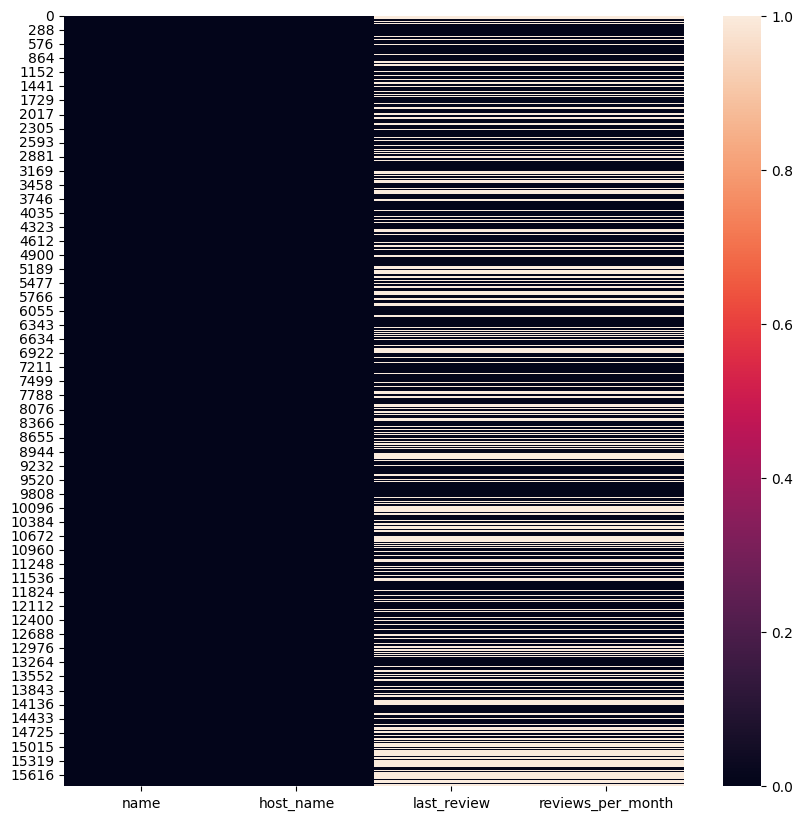

In [16]:
# Sebaran missing value di dalam data
plt.figure(figsize=(10,10))
sns.heatmap(df[['name','host_name','last_review','reviews_per_month']].isna())

Baik kolom `last_review` dan `reviews_per_month` memiliki sebaran nilai NaN yang saling berkaitan. Dikarenakan kedua kolom ini sama-sama merupakan kolom review, maka akan ditinjau lebih detail apakah memiliki hubungan dengan kolom `number_of_reviews`.

In [17]:
# Mengambil data ketika kolom 'number_of_reviews' bernilai 0
numberofreviews_zero_values = df['number_of_reviews'] == 0

# Mengecek apakah untuk setiap kolom 'number_of_reviews' yang bernilai 0, kolom 'reviews_per_month' berisi data NaN
has_nan_values = df.loc[numberofreviews_zero_values, 'reviews_per_month'].isnull()

# Hitung jumlah baris yang sesuai dengan kondisi
num_rows_with_zero_and_nan = has_nan_values.sum()

print("Jumlah baris dimana kolom 'number_of_reviews' berjumlah 0 dan kolom 'reviews_per_month' bernilai NaN:", num_rows_with_zero_and_nan)

Jumlah baris dimana kolom 'number_of_reviews' berjumlah 0 dan kolom 'reviews_per_month' bernilai NaN: 5752


Ternyata, jumlah nilai 0 pada kolom `number_of_reviews` dan kolom `reviews_per_month` sebesar 5752, dimana nilai ini sama dengan jumlah baris *missing value* pada kolom `reviews_per_month`. Dapat dikatakan ketika kolom `number_of_reviews` bernilai 0 maka baik kolom `last_review` dan kolom `reviews_per_month` akan NaN.

Secara garis besar:  
* *Missing value* di kolom `last_review` dan `reviews_per_month` memiliki proporsi yang cukup tinggi (>10%), dengan missing value di kedua kolom tersebut mencapai 36.44%.
* *Missing value* di kolom `last_review` dan `reviews_per_month` memiliki sebaran yang berkaitan, jika data di `last_review` kosong, data di `reviews_per_month` juga kosong. Hal ini dikarenakan di kolom `number_of_reviews` berjumlah 0 yang berarti Airbnb tersebut belum ada yang pernah memberikan ulasan. Dengan begitu tidak akan ada data tanggal ulasan terakhir dan rata-rata jumlah ulasan per bulan.

Ada 2 cara untuk menangani *missing value*:
* Pertama, menghapus baris/kolom yang berisi *missing value*. Cara ini tidak disarankan karena jumlah *missing value* yang tergolong cukup tinggi (sekitar 36%).
* Kedua, mengisi data yang hilang. Cara ini lebih disarankan. Ada beberapa metode yang bisa digunakan untuk mengisi *missing value*, cara yang paling baik adalah dengan mengisi data yang hilang dengan nilai sebenarnya, atau sedekat mungkin dengan nilai asli. Dalam kasus ini, kita akan mencoba mengisi *missing value* berdasarkan kolom lain yang secara *domain knowledge* atau secara statistik berkaitan dengan kolom yang memiliki *missing value*. Jika masih ada kolom yang tidak bisa diisi, barulah kita mengisi dengan angka *mean*, *median* atau *modus*. Ketika tidak ada opsi lain maka data baru akan dihapus.

Kita sudah melihat gambaran kasar anomali di dalam data kita, sekarang, mari kita lihat dan menangani tiap-tiap anomali secara lebih jauh. 
> `reviews_per_month`

Dari analisis di atas, kita sudah tau bahwa *missing value* pada kolom `reviews_per_month` dan kolom `number_of_reviews` saling berkaitan. Maka, kita mengisi kolom `reviews_per_month` dengan nilai 0 didasarkan pada kolom `number_of_reviews`.

In [18]:
# Mengisi dengan nilai 0 untuk setiap nilai NaN 
df['reviews_per_month'].fillna(value=0, inplace=True)

In [19]:
df.isna().sum()

Unnamed: 0                           0
id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5752
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

> Kolom `last_review`

Berbeda dengan kolom `reviews_per_month`, tidak ada kolom lain pada dataset yang bisa dijadikan referensi untuk mengisi kolom `last_review`. Untuk mengisinya, dapat dilakukan dengan berbagai cara seperti mengisi data tanggal sebelum `last_review` terlama atau mengisi berdasarkan data tanggal yang berdekatan dengan baris yang memiliki nilai NaN. Namun pada analisis kali ini, tidak ada kebutuhan untuk menggunakan kolom `last_review` sehingga kolom ini akan di drop.

> Kolom `name`

In [20]:
# Menampilkan data dimana kolom nama berisi nilai NaN
df[df['name'].isna()]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,0.00,1,365,0
544,544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,0.00,1,365,0
572,572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,0.00,1,365,0
669,669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,0.00,1,365,0
1030,1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,0.00,1,365,0
1282,1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,0.00,1,365,0
2075,2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


In [21]:
# Mencari data Airbnb dengan host yang sama menggunakan host_id. Menggunakan ID karena lebih unik, bisa saja terdapat host dengan nama yang sama.
id_host_NaN = [73275200, 51374914, 18852579, 24386225, 22030043, 31895202, 42521288, 55347997]
df[df['host_id'].isin(id_host_NaN)]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,0.00,1,365,0
544,544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,0.00,1,365,0
572,572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,0.00,1,365,0
669,669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,0.00,1,365,0
1030,1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,0.00,1,365,0
1282,1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,0.00,1,365,0
1981,1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaT,0.00,3,1,0
2075,2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


Ada 8 data yang memiliki nilai NaN pada kolom `name`.
- Selain host dengan ID 73275200, host lain hanya memiliki 1 properti Airbnb sehingga tidak bisa melakukan pengecekan nama properti Airbnb lain (jika ada). 
- Host dengan ID 73275200 memiliki 2 properti lain dengan nama yang sama, sehingga Airbnb yang tidak memiliki nama oleh host tersebut akan diisi sama dengan properti lainnya.
- Meski tidak memiliki nama Airbnb, namun terdapat 2 properti yang sudah di review.


In [22]:
# Mengisi kolom nama dengan nilai NaN milik host dengan ID 73275200
df.loc[df['host_id'] == 73275200, 'name'] = df.loc[df['host_id'] == 73275200, 'name'].fillna("Errday Guest House")

In [23]:
# Melakukan pengecekan ulang terhadap data yang telah diisi
df[df['host_id'] == 73275200]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1981,1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaT,0.00,3,1,0
2075,2075,13142743,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


In [24]:
# Untuk data NaN lainnya pada kolom nama, akan diisi dengan pattern "{tipe kamar} di {daerah} dengan harga {harga} oleh {nama pemilik}" sehingga menjadi unik

# Fungsi untuk membuat nama Airbnb
def fill_name(row):
    if pd.isna(row['name']):
        return "A " + str(row['room_type']) + " in " + str(row['neighbourhood']) + " for ฿" + str(row['price']) + " by " + str(row['host_name'])
    else:
        return row['name']

# Pengisian data
df['name'] = df.apply(fill_name, axis=1)

In [25]:
# Pengecekan pengisian data
id_host_NaN = [73275200, 51374914, 18852579, 24386225, 22030043, 31895202, 42521288, 55347997]
df[df['host_id'].isin(id_host_NaN)]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,439,4549768,A Private room in Phra Khanong for ฿1080 by Titawan,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,0.00,1,365,0
544,544,4720818,A Private room in Din Daeng for ฿1200 by Cherry,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,0.00,1,365,0
572,572,4245018,A Private room in Bang Phlat for ฿1200 by Parichart,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,0.00,1,365,0
669,669,6148415,A Entire home/apt in Bang Na for ฿2424 by Chira,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,0.00,1,365,0
1030,1030,8055144,A Private room in Vadhana for ฿5000 by Nantida,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,0.00,1,365,0
1282,1282,10000742,A Private room in Ratchathewi for ฿930 by Diamond Bangkok,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,1594,10710165,A Private room in Vadhana for ฿1000 by Khaneungnit,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,0.00,1,365,0
1981,1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaT,0.00,3,1,0
2075,2075,13142743,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


> Kolom `host_name`

In [26]:
# Mengecek data dengan kolom `host_name` yang kosong
df[df['host_name'].isna()]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


In [27]:
# Mengecek apakah ada data lain dengan host_id yang sama
df[df['host_id'] == 137488762]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


In [28]:
# Karena tidak ada host id yang sama pada data lain, maka data kosong akan diisi dengan "Unknown Name"
df['host_name'] = df['host_name'].fillna('Unknown Name')

In [29]:
# Cek hasil pengisian data
df[df['host_id'] == 137488762]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,3571,19682464,Cozy Hideaway,137488762,Unknown Name,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


In [30]:
# Pengecekan missing value
df.isna().sum()

Unnamed: 0                           0
id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5752
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

#### Column with 0 value
Berdasarkan gambaran data yang telah dilakukan sebelumnya, terdapat nilai minimum pada kolom `price` sebesar 0 dimana hal ini merupakan hal yang tidak masuk akal. Tidak mungkin ada yang sedang berbisnis namun menyewakan Airbnb-nya secara gratis.

In [31]:
# Mencari data dimana kolom harga bernilai 0.
price_0 = df[df['price'] == 0]

# Menampilkan data dimana kolom harga bernilai 0
display(price_0)

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,NaT,0.0,1,0,0


In [32]:
# Karena hanya terdapat 1 data, maka data tersebut akan dihapus karena tidak akan merubah dataset secara signifikan.
df = df.drop(df[df['price'] == 0].index)

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15784 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15784 non-null  int64         
 1   id                              15784 non-null  int64         
 2   name                            15784 non-null  object        
 3   host_id                         15784 non-null  int64         
 4   host_name                       15784 non-null  object        
 5   neighbourhood                   15784 non-null  object        
 6   latitude                        15784 non-null  float64       
 7   longitude                       15784 non-null  float64       
 8   room_type                       15784 non-null  object        
 9   price                           15784 non-null  int64         
 10  minimum_nights                  15784 non-null  int64         
 11  number_

#### Outlier data


Berdasarkan gambaran umum data, terdapat 2 kolom numerik yang perlu dilakukan pengecekan outlier, yaitu kolom `price` dan kolom `minimum_nights` karena kedua kolom ini adalah kolom yang dapat diisi secara bebas oleh Host.

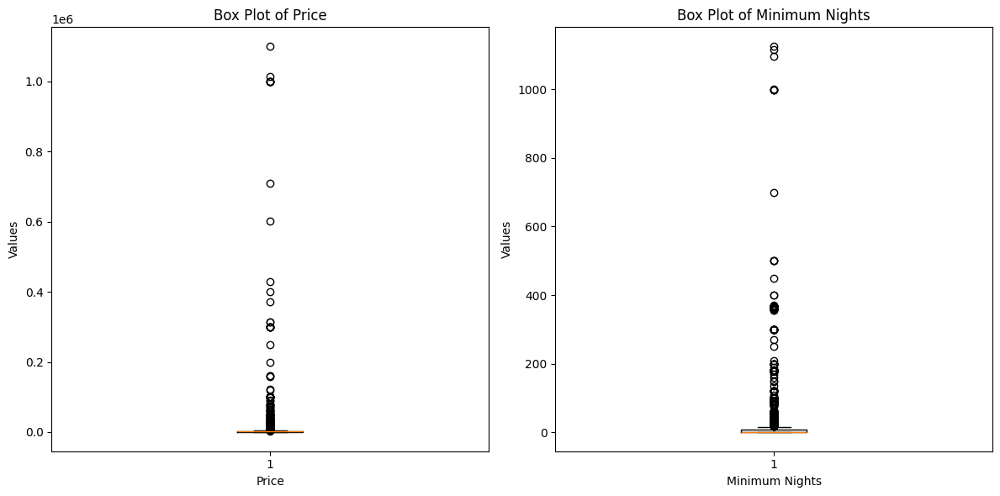

In [34]:
#Set up the figure and axes
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create the box plot for 'price' on the left
axes[0].boxplot(df['price'])
axes[0].set_title('Box Plot of Price')
axes[0].set_xlabel('Price')
axes[0].set_ylabel('Values')

# Create the box plot for 'minimum nights' on the right
axes[1].boxplot(df['minimum_nights'])
axes[1].set_title('Box Plot of Minimum Nights')
axes[1].set_xlabel('Minimum Nights')
axes[1].set_ylabel('Values')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

Ternyata kedua kolom tersebut memiliki data *outlier* yang banyak hingga nilai *extreme*. Untuk menanganinya, data-data *extreme outlier* akan dihapus dari dataset. 

> Kolom `price`

In [35]:
# Membuat filter untuk extreme outlier (dibawah 1% dan diatas 99%)
lower_bound = df["price"].quantile(0.01)
upper_bound  = df["price"].quantile(0.99)

# Data outliers
outliers = df[(df['price'] <= lower_bound) | (df['price'] >= upper_bound)]

print(lower_bound)
print(upper_bound)
print(len(outliers))

outliers

350.0
18000.0
221


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
17,17,66046,"24Flr- 1br Apt near JJ, MRT, BTS",323158,Sue,Chatu Chak,13.822980,100.564840,Entire home/apt,122594,2,9,2020-03-04,0.09,6,180,0
85,85,1961981,S1 hostel (Dorm) Sathorn Bangkok,10138065,S1,Sathon,13.721570,100.545090,Shared room,330,1,82,2019-12-09,0.83,3,358,0
393,393,4450156,"Stylish Apartment in Bangkok, MRT",23095883,Thanakrit,Huai Khwang,13.755950,100.567800,Entire home/apt,100000,365,0,NaT,0.00,1,365,0
460,460,4578892,Lady Dormitory (Air con.) 4 guests,5171292,Somsak,Khlong San,13.721670,100.507610,Shared room,330,2,1,2020-02-15,0.03,10,362,0
516,516,3611516,Benviar - Three Bedroom Duplex (275 sqm) @Chitlom,17499526,Benjamin,Parthum Wan,13.741700,100.545820,Entire home/apt,19276,1,111,2022-12-21,1.13,7,324,41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15455,15455,776042168224443103,1 Upper-Bunk Bed /w Shared Bath,219048748,Kay,Suanluang,13.712770,100.606230,Shared room,280,1,0,NaT,0.00,7,365,0
15456,15456,776071884102373052,1 Lower-Bunk Bed /w Shared Bath,219048748,Kay,Suanluang,13.711320,100.605730,Shared room,280,1,0,NaT,0.00,7,365,0
15473,15473,780103082979427963,Flourish Capsule Hostel,491129139,Chirapat,Bang Rak,13.732114,100.526675,Shared room,295,1,1,2022-12-19,1.00,1,176,1
15548,15548,781476920559679605,Condo Vittorio Sukhumvit 39,491248720,Anyawee,Vadhana,13.729630,100.571710,Private room,100000,1,0,NaT,0.00,1,365,0


In [36]:
# Percentage data outlier
len(outliers)/len(df)*100

1.4001520527116067

In [37]:
# Menyaring DataFrame untuk mengeluarkan outlier
df = df[(df["price"] < upper_bound) & (df["price"] > lower_bound)]

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15438 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15438 non-null  int64         
 1   id                              15438 non-null  int64         
 2   name                            15438 non-null  object        
 3   host_id                         15438 non-null  int64         
 4   host_name                       15438 non-null  object        
 5   neighbourhood                   15438 non-null  object        
 6   latitude                        15438 non-null  float64       
 7   longitude                       15438 non-null  float64       
 8   room_type                       15438 non-null  object        
 9   price                           15438 non-null  int64         
 10  minimum_nights                  15438 non-null  int64         
 11  number_

> Kolom `minimum_nights`

In [48]:
# Membuat filter untuk extreme outlier (diatas 99%, tidak dibuat lower_bound karena sudah masuk akal minimum_nights minimal 1 malam)
upper_bound  = df['minimum_nights'].quantile(0.99)

# Data outliers
outliers = df[(df['minimum_nights'] >= upper_bound)]

print(lower_bound)
print(upper_bound)
print(len(outliers))

1.0
360.0
132


In [49]:
outliers[outliers['minimum_nights'] > 360]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
61,61,1041976,Long-stay special rate spacious entire floor Siam,5735895,Pariya,Parthum Wan,13.748140,100.520160,Entire home/apt,2900,1125,295,2021-08-21,2.61,3,0,0
91,91,428421,2. Bangkok bright Apartment 201,2129668,Wimonpak,Bang Kho laen,13.699350,100.527230,Entire home/apt,700,365,40,2018-10-24,0.31,41,365,0
92,92,428907,1.Bangkok great value Studio WIFI,2129668,Wimonpak,Bang Kho laen,13.699770,100.526520,Entire home/apt,831,365,14,2013-11-01,0.11,41,270,0
94,94,430691,5. Bangkok Bright Apartment -WIFI,2129668,Wimonpak,Bang Kho laen,13.700680,100.522800,Entire home/apt,720,365,26,2016-11-05,0.23,41,365,0
96,96,430706,7. Bangkok big bright Apartment 402,2129668,Wimonpak,Bang Kho laen,13.700860,100.522760,Entire home/apt,1211,365,8,2013-06-28,0.07,41,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13601,13601,683649419529112283,"2 Bed 1 Bath near Mrt Rama 9, Jodd Fair",462810029,Wecare,Huai Khwang,13.755800,100.569460,Private room,1500,365,3,2022-09-30,0.66,1,358,3
14310,14310,729350292936734214,Fully Furnished Condo For Rent near BTS+MRT Bangwa,482009789,วศินี,Phasi Charoen,13.717632,100.453807,Private room,450,365,0,NaT,0.00,1,365,0
14586,14586,742229875837445643,Villa Bajaj a heart of Sukhumvit,484449343,Tannissorn,Vadhana,13.741280,100.559570,Private room,3800,365,0,NaT,0.00,1,365,0
14948,14948,756228586022349526,Superb condo in prime location,39133887,Dick,Vadhana,13.743620,100.558511,Entire home/apt,1500,365,0,NaT,0.00,1,365,0


In [50]:
# Percentage data outlier
len(outliers)/len(df)*100

0.8550330353672756

In [52]:
# Menyaring DataFrame untuk mengeluarkan outlier
df = df[(df["minimum_nights"] < upper_bound)]

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15279 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15279 non-null  int64         
 1   id                              15279 non-null  int64         
 2   name                            15279 non-null  object        
 3   host_id                         15279 non-null  int64         
 4   host_name                       15279 non-null  object        
 5   neighbourhood                   15279 non-null  object        
 6   latitude                        15279 non-null  float64       
 7   longitude                       15279 non-null  float64       
 8   room_type                       15279 non-null  object        
 9   price                           15279 non-null  int64         
 10  minimum_nights                  15279 non-null  int64         
 11  number_

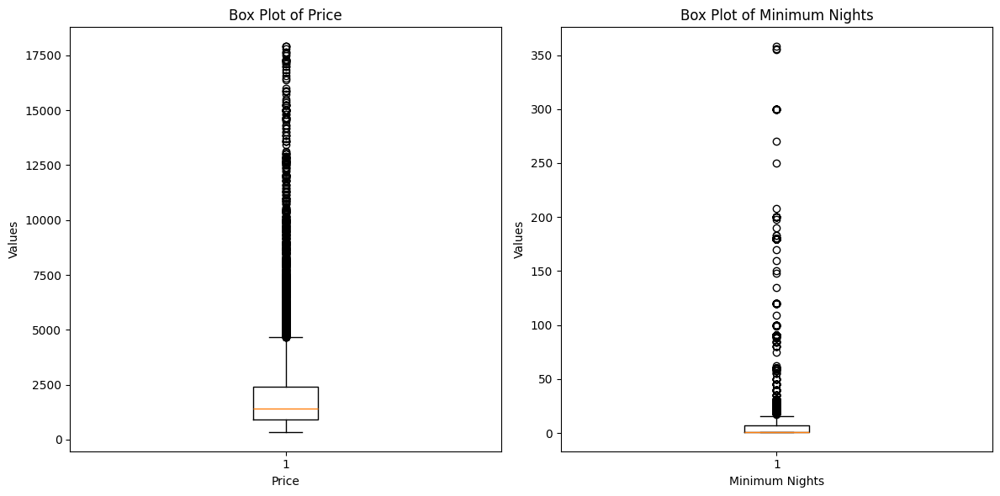

In [54]:
# Menampilkan boxplot untuk extreme outlier yang sudah diubah
#Set up the figure and axes
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create the box plot for 'price' on the left
axes[0].boxplot(df['price'])
axes[0].set_title('Box Plot of Price')
axes[0].set_xlabel('Price')
axes[0].set_ylabel('Values')

# Create the box plot for 'minimum nights' on the right
axes[1].boxplot(df['minimum_nights'])
axes[1].set_title('Box Plot of Minimum Nights')
axes[1].set_xlabel('Minimum Nights')
axes[1].set_ylabel('Values')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

#### Drop Column

In [55]:
# Menghapus kolom 'Unnamed: 0' karena sama dengan index
df.drop('Unnamed: 0', axis=1, inplace=True)

# Menghapus kolom 'last_review' karena tidak akan dibutuhkan dalam analisis kali ini
df.drop('last_review', axis=1, inplace=True)

# Menghapus kolom 'calculated_host_listings_count' karena data pada kolom tersebut sudah invalid akibat adanya drop rows
df.drop('calculated_host_listings_count', axis=1, inplace=True)

#### Data yang sudah bersih
Kita sudah selesai membersihkan data kita, sekarang, mari kita lihat sekilas informasi dari data yang sudah kita bersihkan.

In [56]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(),df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],data=listItem)
print(df.shape)
dfDesc

(15279, 14)


,dataFeatures,dataType,null,unique,uniqueSample
0,id,int64,0,15279,"[23082459, 786742271004207966]"
1,name,object,0,14320,"[1 Bedroom Condo close to MRT &Airport Link Station, Designer's House, 5 mins to skytrain, Vintage Room]"
2,host_id,int64,0,6450,"[10924824, 492463555]"
3,host_name,object,0,5161,"[Pasn, Aimy]"
4,neighbourhood,object,0,50,"[Bang Kho laen, Pom Prap Sattru Phai]"
5,latitude,float64,0,9402,"[13.75439, 13.6905]"
6,longitude,float64,0,10002,"[100.72355, 100.57223]"
7,room_type,object,0,4,"[Private room, Entire home/apt]"
8,price,int64,0,2893,"[9953, 1513]"
9,minimum_nights,int64,0,69,"[135, 21]"


Sekarang datanya sudah bersih dari data duplikat, *missing value*, kolom yang tidak diperlukan, dan *extreme outliers*. Setelah dilakukan pembersihan dataset menjadi 15279 baris dan 14 kolom.

In [57]:
#Save Dataset
df_new = df.to_csv("cleaned_airbnb_bangkok_listings.csv", index=False)

### Data Analysis
Kita sudah melakukan tahap *data understanding* dan *data cleaning*. Sekarang, kita bisa mulai melakukan analisis untuk mencari tahu **akondisi aktual platform serta menganalisis permintaan dan ketersedian properti untuk mengoptimalkan strategi penyewaan dan meningkatkan pengalaman pengguna**.  


#### Ketersediaan properti dan popularitas pengguna per Daerah

> Bagaimana pemetaan jumlah Airbnb berdasarkan daerah di Bangkok?

In [58]:
# Menampilkan 5 daerah dengan jumlah Airbnb terbanyak
airbnb_neighbourhood_count = df.groupby('neighbourhood')['neighbourhood'].value_counts().reset_index().sort_values('count',ascending=False)
airbnb_neighbourhood_count.head()

,neighbourhood,count
47,Vadhana,2087
22,Khlong Toei,2039
37,Ratchathewi,1084
18,Huai Khwang,1070
8,Bang Rak,799


- **Vadhana:** berada di tengah kota dan merupakan pusat bisnis dan hiburan. Terdapat beragam restoran, bar, pusat perbelanjaan, dan akomodasi yang menarik bagi pengguna Airbnb.
- **Khlong Toei:** salah satu distrik terpadat di Bangkok dan menawarkan akesibilitas yang baik ke pusat kota dan berbagai tempat wisata terkenal.
- **Ratchathewi:** lokasi yang strategis dekat dengan pusat perbelanjaan terkenal seperti Siam Paragon dan MBK Center membuat Ratchathewi diminati oleh wisatawan yang ingin berbelanja dan menikmati hiburan di sekitar pusat kota.
- **Huai Khwang:** terkenal dengan pusat hiburan malamnya dan dekat dengan kereta bawah tanah (MRT).
- **Bang Rak:** terkenal dengan keberagaman budaya dan kuliner, serta akses mudah ke Chao Phraya River dan beberapa landmark ikonik Bangkok seperti Wat Arun. Pengguna Airbnb sering mencari akomodasi di Bang Rak untuk pengalaman budaya yang kaya.


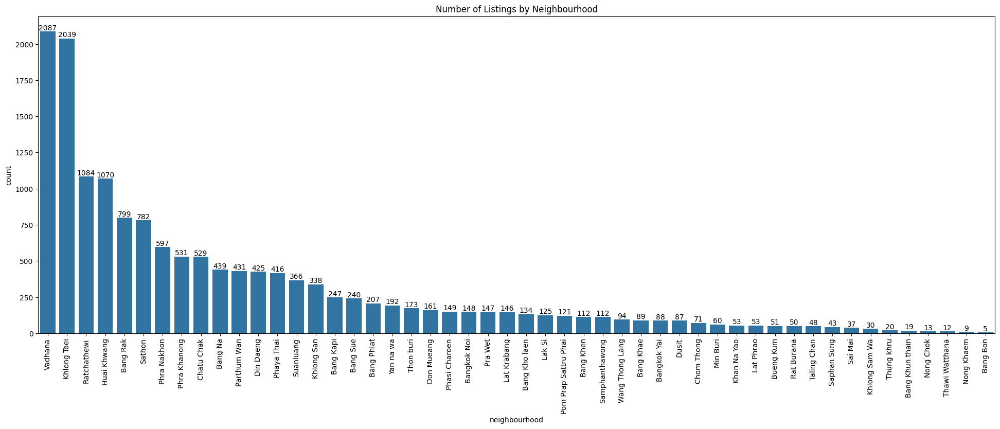

In [59]:
# Menampilkan keseluruhan jumlah Airbnb di setiap daerah
plt.figure(figsize = (24,8))
ax = sns.countplot(x='neighbourhood', data=df, order=df['neighbourhood'].value_counts().index)
abs_values = df['neighbourhood'].value_counts(ascending=False).values
ax.bar_label(container=ax.containers[0], labels=abs_values)

ax.set_title('Number of Listings by Neighbourhood')
plt.xticks(rotation=90)
plt.show()

In [60]:
# Membuat map Bangkok dengan nama dalam Bahasa Inggris
bangkok_map = folium.Map(location=[13.7563, 100.5018], zoom_start=10, tiles='https://tile.openstreetmap.de/{z}/{x}/{y}.png', attr='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors')

# Mengambil koordinat per daerah untuk dipetakan
bangkok = requests.get("https://github.com/pcrete/gsvloader-demo/blob/master/geojson/Bangkok-districts.geojson")

# Untuk membuat group markers
marker_cluster = MarkerCluster().add_to(bangkok_map)

# Menambahkan markers untuk setiap Airbnb dengan warna berdasarkan 
# Add markers for each district with color based on neighbourhood
for index, row in df.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']],popup=row['neighbourhood'],icon=folium.Icon(color='blue')).add_to(bangkok_map)

In [61]:
# Membuat map Bangkok dengan nama dalam Bahasa Inggris
bangkok_map = folium.Map(location=[13.7563, 100.5018], zoom_start=11, tiles='https://tile.openstreetmap.de/{z}/{x}/{y}.png', attr='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors')

# Mengambil koordinat per daerah untuk dipetakan
url = "https://raw.githubusercontent.com/pcrete/gsvloader-demo/master/geojson/Bangkok-districts.geojson"

# Memgabil data geojson
bangkok = requests.get(url).json()

# Membuat map choropleth berdasarkan jumlah Airbnb per daerah
folium.Choropleth(
    geo_data=bangkok,
    data=airbnb_neighbourhood_count,
    columns=["neighbourhood", "count"],
    key_on="feature.properties.dname_e",
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Number of Airbnb Listings",
    highlight=True,
).add_to(bangkok_map)

# Menampilkan map
bangkok_map

Insight:
- Vadhana, Khlong Toei, Ratchathewi, Huai Khwang, Bang Ra secara berurutan menjadi daerah dengan jumlah Airbnb terbanyak di Bangkok.
- Terlihat adanya tren peningkatan jumlah Airbnb seiring semakin mendekatnya lokasi properti ke pusat kota.

> Apa daerah yang paling populer di kalangan penyewa Airbnb?


In [62]:
# Menampilkan total jumlah review berdasarkan daerah di Bangkok
review_neighbourhood = df.groupby('neighbourhood')['number_of_reviews'].sum().reset_index().sort_values('number_of_reviews',ascending=False)
review_neighbourhood.head(10)

,neighbourhood,number_of_reviews
22,Khlong Toei,40637
47,Vadhana,37031
41,Sathon,22031
37,Ratchathewi,20564
18,Huai Khwang,17676
8,Bang Rak,17474
31,Phaya Thai,13608
29,Parthum Wan,8074
13,Chatu Chak,8020
33,Phra Nakhon,7828


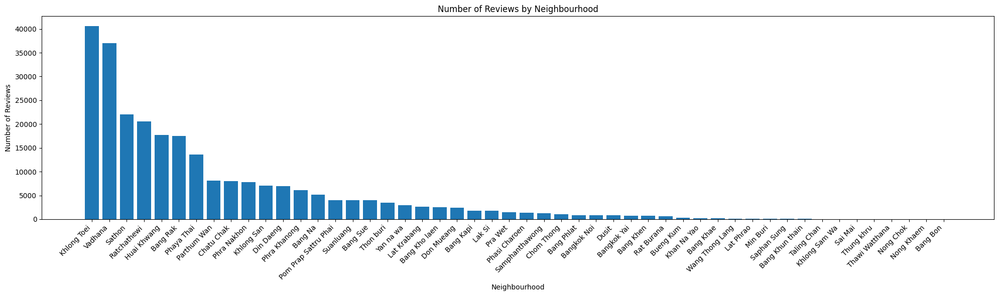

In [63]:
plt.figure(figsize=(20, 6))
plt.bar(review_neighbourhood['neighbourhood'], review_neighbourhood['number_of_reviews'])
plt.xlabel('Neighbourhood')
plt.ylabel('Number of Reviews')
plt.title('Number of Reviews by Neighbourhood')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [64]:
bangkok_map = folium.Map(location=[13.7563, 100.5018], zoom_start=11, tiles='https://tile.openstreetmap.de/{z}/{x}/{y}.png', attr='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors')

# Provide the direct URL to the raw GeoJSON data
url = "https://raw.githubusercontent.com/pcrete/gsvloader-demo/master/geojson/Bangkok-districts.geojson"

# Fetch the GeoJSON data
bangkok = requests.get(url).json()

folium.Choropleth(
    geo_data=bangkok,
    data=review_neighbourhood,
    columns=["neighbourhood", "number_of_reviews"],
    key_on="feature.properties.dname_e",
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Review Distribution",
    highlight=True,
).add_to(bangkok_map)

bangkok_map

Insight:
- Khlong Toei, Vadhana, Sathon, Ratchathewi, Huai Khwang menjadi daerah paling populer berdasarkan jumlah review.
- Terlihat adanya tren peningkatan popularitas Airbnb seiring semakin mendekatnya lokasi properti ke pusat kota. Tren peningkatan popularitas Airbnb seiring dengan mendekatnya lokasi properti ke pusat kota dapat dijelaskan dengan berbagai faktor. Salah satunya adalah preferensi banyak penyewa Airbnb yang lebih memilih tinggal di daerah yang lebih dekat dengan pusat kota. Selain itu, kemungkinan faktor aksesibilitas dan kenyamanan juga turut memengaruhi, di mana lokasi yang lebih dekat dengan pusat kota biasanya memiliki akses yang lebih mudah ke fasilitas umum dan tempat-tempat wisata. Di Bangkok, fasilitas transportasi seperti Bangkok Rail Transit (BRT) berada di pusat kota.
- Jumlah ulasan dapat memberikan indikasi berapa banyak pengguna Airbnb yang menginap atau mengunjungi suatu tempat. Jika suatu daerah atau properti memiliki jumlah ulasan yang tinggi, ini dapat menunjukkan bahwa tempat tersebut cukup populer di kalangan pengguna Airbnb.

> Apakah ada korelasi antara harga Airbnb dengan kepopuleran dari lokasi Airbnb?

In [67]:
# Group by neighborhood and calculate total reviews and median price (median karena data price tidak terdistribusi normal)
neighbourhood_review_price = df.groupby('neighbourhood').agg({'number_of_reviews': 'sum', 'price': np.median}).reset_index()
neighbourhood_review_price = neighbourhood_review_price.sort_values('number_of_reviews', ascending=False)

# Display the summary
neighbourhood_review_price.head(10)

,neighbourhood,number_of_reviews,price
22,Khlong Toei,40637,1697.0
47,Vadhana,37031,1961.0
41,Sathon,22031,1287.0
37,Ratchathewi,20564,1529.0
18,Huai Khwang,17676,1353.5
8,Bang Rak,17474,1871.0
31,Phaya Thai,13608,1386.0
29,Parthum Wan,8074,2390.0
13,Chatu Chak,8020,1100.0
33,Phra Nakhon,7828,1200.0


In [161]:
# Korelasi antara jumlah review dengan harga
neighbourhood_review_price[['number_of_reviews', 'price']].corr()

,number_of_reviews,price
number_of_reviews,1.000000,0.404421
price,0.404421,1.000000


Berdasarkan hasil korelasi sebesar 0.4, dapat dikatakan antara jumlah review dengan harga sewa memiliki *moderate positive correlation*. Artinya semakin tinggi jumlah review yang diterima, maka harga sewa properti tersebut juga akan meningkat meskipun tidak dalam tingkat yang sangat kuat. Dengan demikian, kita bisa mengamati bahwa popularitas properti Airbnb, yang tercermin dari jumlah review, berpengaruh sedang terhadap harga sewanya.

In [68]:
# Merge the two summaries on neighbourhood
combined_summary_neighbourhood = airbnb_neighbourhood_count.merge(neighbourhood_review_price, on='neighbourhood')

combined_summary_neighbourhood

,neighbourhood,count,number_of_reviews,price
0,Vadhana,2087,37031,1961.0
1,Khlong Toei,2039,40637,1697.0
2,Ratchathewi,1084,20564,1529.0
3,Huai Khwang,1070,17676,1353.5
4,Bang Rak,799,17474,1871.0
5,Sathon,782,22031,1287.0
6,Phra Nakhon,597,7828,1200.0
7,Phra Khanong,531,6066,1000.0
8,Chatu Chak,529,8020,1100.0
9,Bang Na,439,5189,1000.0


In [69]:
# Choropleth map berdasarkan persebaran harga
bangkok_map = folium.Map(location=[13.7563, 100.5018], zoom_start=11, tiles='https://tile.openstreetmap.de/{z}/{x}/{y}.png', attr='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors')

# Provide the direct URL to the raw GeoJSON data
url = "https://raw.githubusercontent.com/pcrete/gsvloader-demo/master/geojson/Bangkok-districts.geojson"

# Fetch the GeoJSON data
bangkok = requests.get(url).json()

folium.Choropleth(
    geo_data=bangkok,
    data=combined_summary_neighbourhood,
    columns=["neighbourhood", "price"],
    key_on="feature.properties.dname_e",
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Price Distribution",
    highlight=True,
).add_to(bangkok_map)

bangkok_map

Berdasarkan visualisasi map diatas, penyebaran harga per cukup tersebar secara merata, dengan semakin mendekati pusat kota, harga sewa semakin mahal. Namun daerah seperti Nong Chok yang berada di pinggir kota justru memiliki harga sewa paling mahal. Perlu dilakukan peninjauan lebih lanjut mengenai hal ini.

Insight:
- Korelasi moderat terlihat antara popularitas daerah berdasarkan jumlah review dengan harga sewa.
- Secara keseluruhan, penyebaran harga relatif merata, namun terdapat kecenderungan peningkatan harga sewa seiring mendekatnya lokasi ke pusat kota. Hal ini sesuai dengan observasi visual sebelumnya, di mana pusat kota memiliki lebih banyak Airbnb dan jumlah review yang lebih tinggi. Namun, ada pengecualian seperti di daerah Nong Chok yang berada di pinggiran namun memiliki harga sewa yang lebih tinggi. Perlu dilakukan investigasi lebih lanjut untuk memahami penyebabnya, mengingat Nong Chok tidak dianggap sebagai daerah elit di Bangkok. Sebaliknya, distrik ini dikenal sebagai daerah yang lebih terjangkau, seharusnya harga sewa yang lebih rendah daripada beberapa daerah elit lainnya di Bangkok.

#### Analisis ketersediaan dan permintaan berdasarkan tipe kamar

> Apa jenis kamar yang paling banyak tersedia di Airbnb Bangkok?

In [70]:
#The most common room type on Airbnb
airbnb_room_type = df.groupby('room_type')['room_type'].value_counts().reset_index(name='total_rooms').sort_values('total_rooms',ascending=False)

# Calculate the total of the rooms
total_room_type = df['room_type'].count()

# Create a percentage column
airbnb_room_type['percentage'] = round((airbnb_room_type['total_rooms'] / total_room_type),3) * 100
airbnb_room_type

,room_type,total_rooms,percentage
0,Entire home/apt,8636,56.5
2,Private room,5596,36.6
1,Hotel room,617,4.0
3,Shared room,430,2.8


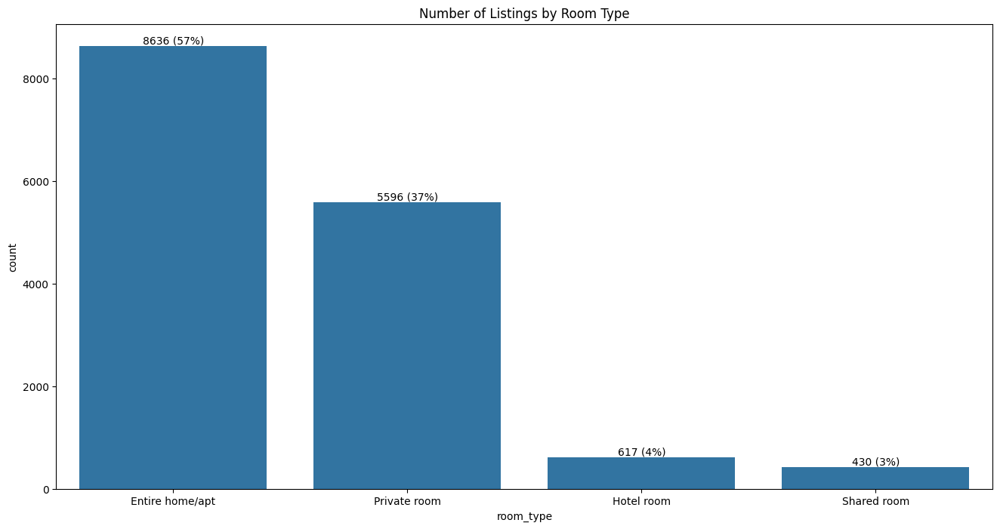

In [75]:
# using countplot to visualize the number of Airbnbs by room type
plt.figure(figsize = (16,8))
ax = sns.countplot(x='room_type', data=df, order=df['room_type'].value_counts().index)
abs_values = df['room_type'].value_counts(ascending=False)
rel_values = df['room_type'].value_counts(ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
ax.bar_label(container=ax.containers[0], labels=lbls) #puts the labels on the bars
ax.set_title('Number of Listings by Room Type')
plt.xticks(rotation=0)
plt.show()

Insight:
- Tipe kamar yang paling banyak pada plaform Airbnb tersebut adalah *Entire home/apt*, dengan persentase sebesar 57%, diikuti oleh *private room*, *hotel room*, dan *shared room*.

> Apa tipe kamar yang paling populer di kalangan penyewa Airbnb?

In [71]:
# Grouping and calculating the number of reviews based on room type
room_type_review = df.groupby('room_type')[['number_of_reviews']].sum().sort_values('number_of_reviews', ascending=False)
room_type_review

,number_of_reviews
room_type,
Entire home/apt,194600
Private room,49956
Hotel room,12296
Shared room,2254


<Figure size 800x600 with 0 Axes>

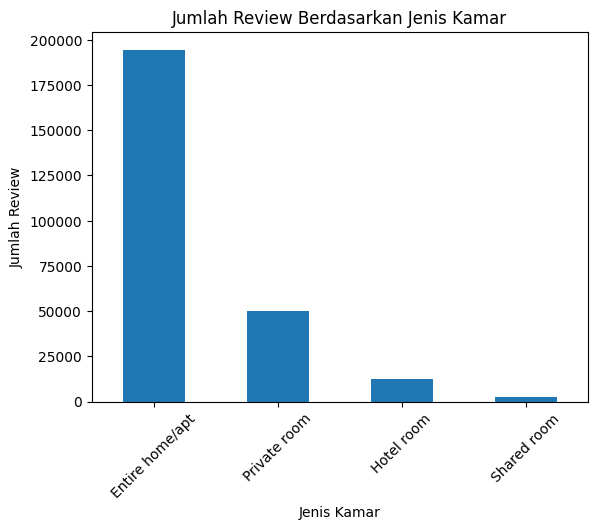

In [154]:
# Membuat plot
plt.figure(figsize=(8, 6))
room_type_review.plot(kind='bar', legend=None)
plt.title('Jumlah Review Berdasarkan Jenis Kamar')
plt.xlabel('Jenis Kamar')
plt.ylabel('Jumlah Review')
plt.xticks(rotation=45)
plt.show()

Insight:
- Tipe kamar yang paling populer berdasarkan jumlah review adalah *Entire home/apt* hampir 200 ribu ulasan. Angka ini hampir 4 kali lipat tipe kamar terpopuler kedua yaitu *Private room* dengan jumlah ulasan hampir 50 ribu ulasan.

> Apakah ketersediaan tipe kamar sudah memenuhi permintaan/kepopuleran pasar?

In [99]:
# Grouping and calculating the room availability for the next 365 days based on room type
room_type_availability = df.groupby('room_type')[['availability_365']].median().sort_values('availability_365', ascending=True)
room_type_availability

,availability_365
room_type,
Entire home/apt,244.5
Hotel room,345.0
Private room,347.0
Shared room,352.5


<Figure size 800x600 with 0 Axes>

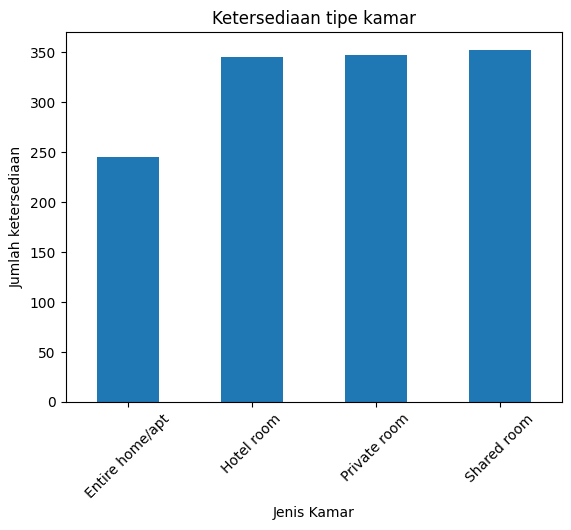

In [155]:
# Membuat plot
plt.figure(figsize=(8, 6))
room_type_availability.plot(kind='bar', legend=None)
plt.title('Ketersediaan tipe kamar')
plt.xlabel('Jenis Kamar')
plt.ylabel('Jumlah ketersediaan')
plt.xticks(rotation=45)
plt.show()

Insight:
- Permintaan atau popularitas pasar direpresentasikan dengan jumlah ulasan, di mana tipe kamar yang paling populer adalah Entire home, diikuti oleh private room, hotel room, dan shared room. Namun, dalam hal ketersediaan kamar selama 365 hari ke depan, terlihat bahwa Entire home sudah banyak dipesan oleh pengguna Airbnb karena ketersediaannya yang lebih rendah dibandingkan dengan tipe kamar lainnya. 
- Secara keseluruhan, masih banyak kamar yang tersedia untuk disewa yang menandakan perlunya strategi untuk meningkatkan penjualan.

> Bagaimana pola harga Airbnb berdasarkan tipe kamar?

In [76]:
# Grouping and calculating the number of reviews based on room type
room_type_price = df.groupby('room_type')[['price']].median().sort_values('price', ascending=False)
room_type_price

,price
room_type,
Hotel room,1750.0
Entire home/apt,1523.0
Private room,1212.0
Shared room,550.0


<Figure size 800x600 with 0 Axes>

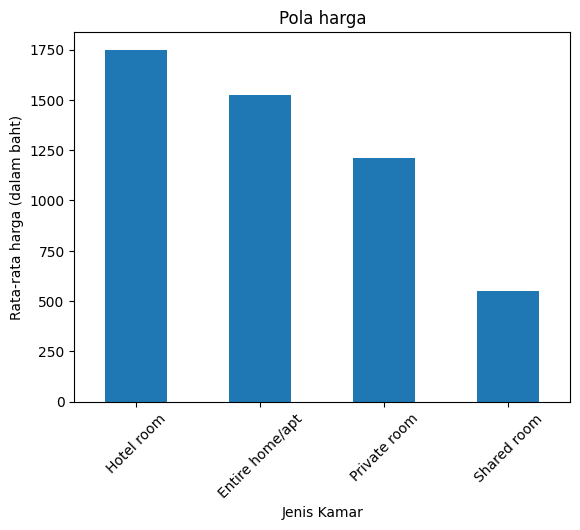

In [157]:
# Membuat plot
plt.figure(figsize=(8, 6))
room_type_price.plot(kind='bar', legend=None)
plt.title('Pola harga')
plt.xlabel('Jenis Kamar')
plt.ylabel('Rata-rata harga (dalam baht)')
plt.xticks(rotation=45)
plt.show()

Insight:
- Berdasarkan rata-rata harga, tipe kamar hotel room memiliki harga sewa yang paling mahal diikuti oleh entire home, private room, dan shared room. Hal ini mungkin disebabkan karena adanya pelayanan lebih yang diberikan oleh tipe kamar hotel.

In [150]:
# Merge summaries on room_type
summary_room_type = airbnb_room_type.merge(room_type_review, on='room_type')
summary_room_type = summary_room_type.merge(room_type_availability, on='room_type')
summary_room_type = summary_room_type.merge(room_type_price, on='room_type')

summary_room_type

,room_type,total_rooms,percentage,number_of_reviews,availability_365,price
0,Entire home/apt,8636,56.5,194600,244.5,1523.0
1,Private room,5596,36.6,49956,347.0,1212.0
2,Hotel room,617,4.0,12296,345.0,1750.0
3,Shared room,430,2.8,2254,352.5,550.0


In [151]:
# Sort the indices based on each column's values
sorted_indices = {
    key: sorted(range(len(summary_room_type[key])), key=lambda k: summary_room_type[key][k])
    for key in summary_room_type.keys() if key != 'room_type'
}

# Reverse the sorted indices
reversed_indices = {key: indices[::-1] for key, indices in sorted_indices.items()}

# Skala nilai 1-4, dimana nilai 4 adalah nilai tertinggi
summary_room_type['percentage'] = [sorted_indices['percentage'].index(i) + 1 for i in range(len(sorted_indices['percentage']))] # Sorting berdasarkan nilai persen / jumlah tertinggi
summary_room_type['number_of_reviews'] = [sorted_indices['number_of_reviews'].index(i) + 1 for i in range(len(sorted_indices['number_of_reviews']))] # sorting berdasarkan nilai review tertinggi / populer
summary_room_type['availability_365'] = [reversed_indices['availability_365'].index(i) + 1 for i in range(len(reversed_indices['availability_365']))] # sorting berdasarkan yang paling banyak di booking
summary_room_type['price'] = [reversed_indices['price'].index(i) + 1 for i in range(len(reversed_indices['price']))] # Sorting berdasarkan harga sewa termurah

summary_room_type.drop('total_rooms',axis=1,inplace=True)

In [152]:
summary_room_type

,room_type,percentage,number_of_reviews,availability_365,price
0,Entire home/apt,4,4,4,2
1,Private room,3,3,2,3
2,Hotel room,2,2,3,1
3,Shared room,1,1,1,4


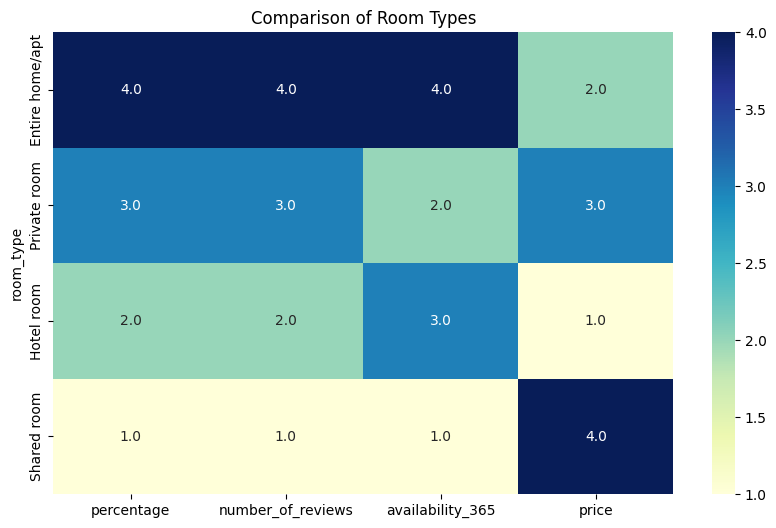

In [153]:
# Set the room_type column as the index
summary_room_type.set_index('room_type', inplace=True)
# Create a heatmap to compare values for each room type
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(summary_room_type, annot=True, cmap='YlGnBu', fmt='.1f')
heatmap.set_title('Comparison of Room Types')
plt.show()

Visualisasi diatas:
- percentage: angka 1 berarti paling rendah sementara angka 4 berarti paling tinggi
- number_of_reveiws: angka 1 berarti paling sedikit, angka 4 paling banyak
- availability_365: angka 1 berarti ketersediaan paling banyak (tidak laku), angka 4 ketersediaan paling sedikit (laku)
- price: angka 1 berarti paling mahal, angka 4 paling murah

Insight:
- Dengan menggabungkan data dan mengvisualisasikannya dalam bentuk heatmap, perbandingan antara tipe kamar menjadi lebih jelas. Terlihat bahwa tipe kamar Entire home memiliki jumlah properti terbanyak, paling banyak ulasan (populer), dan paling sering dibooking, menunjukkan preferensi tinggi dari pengguna Airbnb yang berkunjung ke Bangkok. Selain itu, harga dari tipe kamar ini tidak termasuk yang paling mahal. Bisa juga populer karena pengguna memiliki privacy, membawa orang dalam jumlah banyak, fasilitas dan keamanan.
- Hotel room merupakan tipe kamar yang paling sering dibooking setelah entire room, meskipun jumlahnya tidak sebanyak entire room, memiliki ulasan yang tidak terlalu banyak, dan harganya paling tinggi. Hal ini dapat menjadi pertimbangan untuk meninjau kembali strategi harga.
- Shared room memiliki kinerja yang kurang optimal meskipun memiliki harga yang paling terjangkau. Diperlukan evaluasi lebih lanjut untuk meningkatkan kinerja dan menarik minat lebih banyak penyewa.

#### Analisis Host dan portfolio Airbnb Host

> Bagaimana efektivitas penggunaan platform Airbnb oleh host?

In [123]:
# Grouping and calculating the host_id based on host_id untuk mencari jumlah properti yang dimiliki oleh setiap host_id
host_count_property = df.groupby(['host_id','host_name'])['host_id'].value_counts().reset_index().sort_values('count', ascending=False).head(10)
host_count_property

,host_id,host_name,count
4349,201677068,Curry,213
2098,52161947,Noons,92
1109,26736483,K,89
4746,228535635,Pornchai,62
2465,68154488,Dusadee,61
2332,62257044,Ludoping,55
370,8444643,Kiattisak,51
5577,312545246,Mike,49
2438,66923696,Panda,48
2823,89820474,Ken-Bambu,48


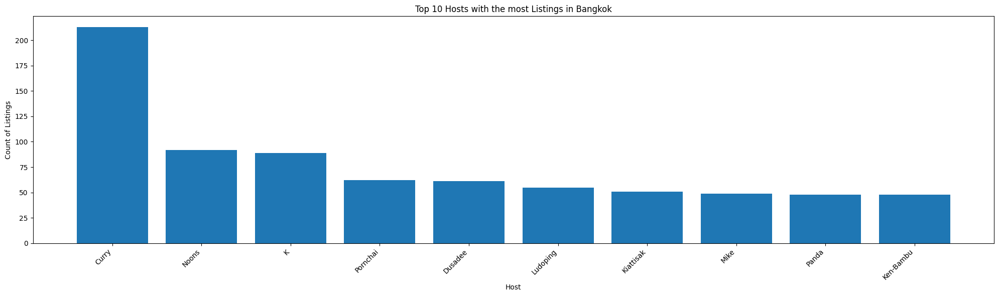

In [124]:
# Plot 10 Host pemilik Airbnb terbanyak
plt.figure(figsize=(20, 6))
plt.bar(host_count_property['host_name'], host_count_property['count'])
plt.xlabel('Host')
plt.ylabel('Count of Listings')
plt.title('Top 10 Hosts with the most Listings in Bangkok')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Insight:
- Dari 10 host teratas, distribusi properti mereka tergolong merata, walaupun ada beberapa host yang memiliki jumlah properti yang lebih tinggi. Salah satu host teratas, Curry, telah memasukkan lebih dari 200 properti ke dalam platform Airbnb. Sementara itu, Noons memiliki hampir 100 properti, dan 8 host teratas lainnya mendaftarkan sekitar 75 properti. Fenomena ini menandakan tingkat kepercayaan yang tinggi terhadap platform Airbnb oleh para host, sehingga mereka merasa yakin dan nyaman untuk memasukkan sejumlah besar properti ke dalam platform Airbnb perusahaan.

In [125]:
# Grouping and calculating the number of reviews for each host
host_reviews_count = df.groupby(['host_id', 'host_name'])['number_of_reviews'].sum().reset_index(name='total_reviews')

In [126]:
# Merging the host_count_property DataFrame with host_reviews_count
host_rate_reviews = host_count_property.merge(host_reviews_count, on=['host_id', 'host_name'])

In [128]:
host_rate_reviews['average_reviews_per_property'] = host_rate_reviews['total_reviews']/host_rate_reviews['count']

In [129]:
host_rate_reviews

,host_id,host_name,count,total_reviews,average_reviews_per_property
0,201677068,Curry,213,4664,21.896714
1,52161947,Noons,92,1460,15.869565
2,26736483,K,89,2937,33.000000
3,228535635,Pornchai,62,8,0.129032
4,68154488,Dusadee,61,233,3.819672
5,62257044,Ludoping,55,1111,20.200000
6,8444643,Kiattisak,51,471,9.235294
7,312545246,Mike,49,969,19.775510
8,66923696,Panda,48,349,7.270833
9,89820474,Ken-Bambu,48,499,10.395833


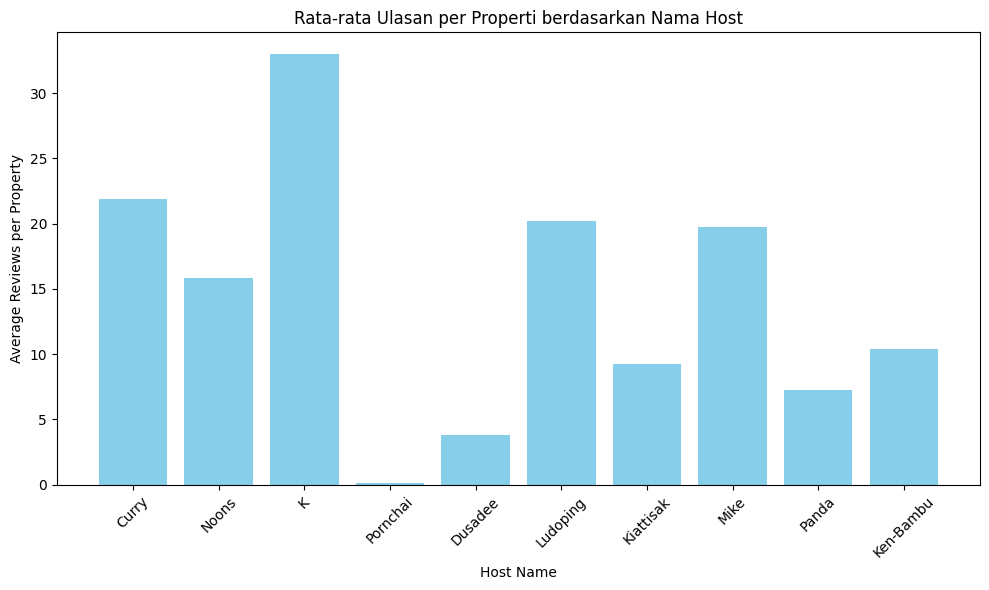

In [159]:
# Membuat plot
plt.figure(figsize=(10, 6))
plt.bar(host_rate_reviews['host_name'], host_rate_reviews['average_reviews_per_property'], color='skyblue')
plt.xlabel('Host Name')
plt.ylabel('Average Reviews per Property')
plt.title('Rata-rata Ulasan per Properti berdasarkan Nama Host')
plt.xticks(rotation=45) 
plt.tight_layout()

In [131]:
# Grouping and calculating the host_id based on host_id untuk mencari jumlah properti yang dimiliki oleh setiap host_id
host_count_property1 = df.groupby(['host_id','host_name'])['host_id'].value_counts().reset_index().sort_values('count', ascending=False)
host_reviews_count1 = df.groupby(['host_id', 'host_name'])['number_of_reviews'].sum().reset_index(name='total_reviews')
host_rate_reviews1 = host_count_property1.merge(host_reviews_count1, on=['host_id', 'host_name'])
host_rate_reviews1['average_reviews_per_property'] = host_rate_reviews1['total_reviews']/host_rate_reviews1['count']

# Berdasarkan averagei reviews per property paling banyak
host_rate_reviews1.sort_values('average_reviews_per_property', ascending=False).head(10)

,host_id,host_name,count,total_reviews,average_reviews_per_property
6332,116193397,Suchada,1,1224,1224.000000
1353,49220458,Pim,2,746,373.000000
1855,2389272,Bua,2,732,366.000000
4859,40576227,Suttaporn,1,363,363.000000
194,30963587,Themustang,10,3584,358.400000
2564,19484732,Sitara,1,302,302.000000
1065,158545122,Pailin,3,901,300.333333
3761,9906827,Nokiko,1,293,293.000000
3865,9407280,Timo,1,287,287.000000
3833,9390848,VeeZa,1,271,271.000000


In [165]:
host_rate_reviews1top = host_rate_reviews1.sort_values('average_reviews_per_property', ascending=False).head(10)

In [166]:
host_rate_reviews1top

,host_id,host_name,count,total_reviews,average_reviews_per_property
6332,116193397,Suchada,1,1224,1224.000000
1353,49220458,Pim,2,746,373.000000
1855,2389272,Bua,2,732,366.000000
4859,40576227,Suttaporn,1,363,363.000000
194,30963587,Themustang,10,3584,358.400000
2564,19484732,Sitara,1,302,302.000000
1065,158545122,Pailin,3,901,300.333333
3761,9906827,Nokiko,1,293,293.000000
3865,9407280,Timo,1,287,287.000000
3833,9390848,VeeZa,1,271,271.000000


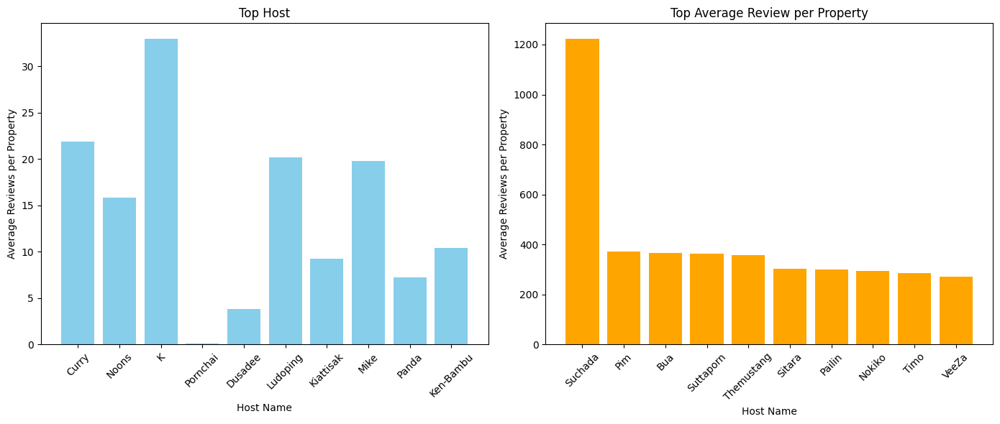

In [168]:
# Plot pertama di sebelah kiri
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)  # 1 row, 2 columns, plot pertama
plt.bar(host_rate_reviews['host_name'], host_rate_reviews['average_reviews_per_property'], color='skyblue')
plt.xlabel('Host Name')
plt.ylabel('Average Reviews per Property')
plt.title('Top Host')
plt.xticks(rotation=45)

# Plot kedua di sebelah kanan
plt.subplot(1, 2, 2)  # 1 row, 2 columns, plot kedua
plt.bar(host_rate_reviews1top['host_name'], host_rate_reviews1top['average_reviews_per_property'], color='orange')
plt.xlabel('Host Name')
plt.ylabel('Average Reviews per Property')
plt.title('Top Average Review per Property')
plt.xticks(rotation=45)

# Menampilkan plot
plt.tight_layout()
plt.show()

Insight:
- Berdasarkan plot di atas, ternyata memiliki banyak properti yang disewakan tidak menjamin popularitas. Dapat dilihat dari sisi sebelah kiri bahwa untuk host dengan jumlah properti terbanyak, rata-rata ulasan per properti hanya sekitar 33 ulasan per properti. Sementara itu, pada rata-rata ulasan per properti tertinggi yang terlihat di visualisasi sebelah kanan, mencapai 1200 ulasan per properti. Hal ini menunjukkan perlunya tinjauan yang lebih mendalam. Salah satu langkah yang dapat dilakukan adalah dengan menambahkan kolom baru seperti fasilitas yang disediakan, komentar dari pengguna, dan penilaian dari 1 hingga 5 oleh pengguna sehingga tidak hanya mengetahui popularitas tetapi juga tingkat kepuasan pengguna. Dengan penambahan data tersebut memungkinkan untuk melakukan perbandingan antara pemilik Airbnb secara mendalam dan meningkatkan pendapatan mereka.

In [148]:
correlation = host_rate_reviews1['total_reviews'].corr(host_rate_reviews1['count'])
print("Correlation between total_reviews and count:", correlation)

Correlation between total_reviews and count: 0.580166717468806


> Apa tren atau pola tertentu dalam penamaan Airbnb?

In [139]:
# Analisis kata-kata yang digunakan oleh host dalam memberi nama pada Airbnb mereka
# Mengambil daftar semua nama
names = df['name'].tolist()
name_words = []
for name in names:
    name = str(name).split()
    for word in name:
        name_words.append(word.lower())

# Menghilangkan kata-kata berhenti (stopwords) dari daftar kata-kata
filtered_words = [word for word in name_words if word not in stopwords.words('english')]

# Menghitung jumlah kemunculan kata-kata dan mengambil 25 kata paling umum dipakai
words_count = Counter(filtered_words).most_common()
words_count = words_count[:25]

# Mengubah data kedalam dataframe agar bisa di plot
words_df = pd.DataFrame(words_count)
words_df.head(10)

words_df.rename(columns={0:"Words", 1:"Count"}, inplace=True)

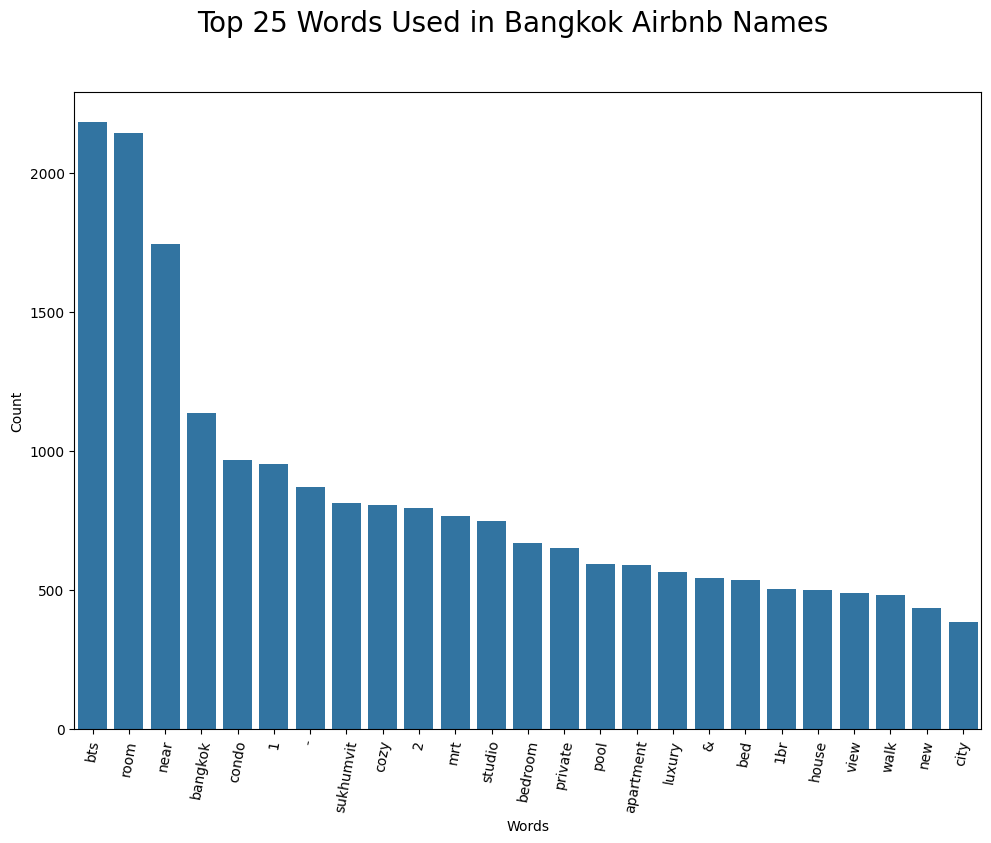

In [140]:
# Plot Top 25 Kata yang dipakai untuk nama Airbnb
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
fig.suptitle('Top 25 Words Used in Bangkok Airbnb Names', fontsize=20)
sns.barplot(x='Words', y='Count', data=words_df, ax=ax)
plt.xticks(rotation=80)
plt.show()

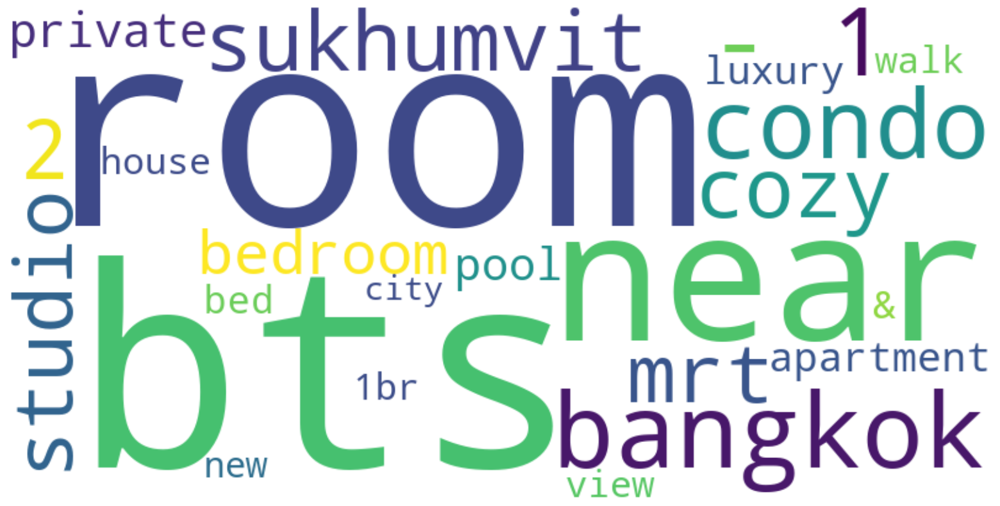

In [147]:
cvec_dict = dict(zip(words_df.Words, words_df.Count))

wordcloud = WordCloud(width=800, height=400, background_color="white")
wordcloud.generate_from_frequencies(frequencies=cvec_dict)
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

Insight:
- Berdasarkan 25 kata yang sering digunakan oleh para Host untuk menamai Airbnb mereka, terlihat sebuah tren yang jelas yaitu Host menggunakan istilah yang spesifik untuk memudahkan pencarian oleh calon pengguna Airbnb. Kata-kata seperti bts (Bangkok Transit Station) untuk mempromosikan Airbnb mereka dekat dengan transportasi publik, kemudian room, near, bangkok, condo, hal ini sangat umum untuk digunakan. Secara sederhana Host menjelaskan kondisi/lokasi Airbnb yang mereka sewakan.

## Kesimpulan dan Rekomendasi 

**Kesimpulan**<br>
Dari analisis yang telah dilakukan, kita bisa membuat kesimpulan sebagai berikut:
1. Ketersediaan properti dan popularitas pengguna per Daerah:
* Daerah-daerah seperti Vadhana dan Khlong Toei memiliki jumlah Airbnb terbanyak dan daerah populer berdasarkan jumlah review di Bangkok.
* Tren peningkatan popularitas, jumlah, dan harga sewa Airbnb terjadi di daerah yang semakin mendekat ke pusat kota. Dikarenakan merupakan lokasi yang strategis.

2. Analisis Tipe Kamar dan Harga:
* Entire home/apartment menjadi tipe kamar paling banyak (57%), terpopuler berdasarkan jumlah ulasan, dan paling sedikit ketersediaannya namun bukan yang termahal.
* Hotel room merupakan tipe kamar yang paling sering dibooking setelah entire room, meskipun jumlahnya tidak sebanyak entire room, memiliki ulasan yang tidak terlalu banyak, dan harganya paling tinggi.
* Shared room memiliki kinerja yang kurang optimal meskipun memiliki harga yang paling terjangkau.

3. Host dan portfolio Airbnb Host:
* Banyak host yang sudah mempercayakan properti untuk disewakan di platform airbnb milik perusahaan hingga 200 properti.
* Banyak properti yang disewakan tidak menjamin popularitas per properti.
* Kata-kata yang sering digunakan untuk menamai Airbnb seperti bts, room, near adalah jenis kata yang umum dan menjelaskan kondisi Airbnb host sehingga memudahkan pencarian oleh calon pengguna Airbnb.

**Rekomendasi**
1. Strategi Pemasaran Berbasis Data:
* Menggunakan data popularitas dan harga, Airbnb dapat mengoptimalkan strategi pemasaran di daerah-daerah yang populer untuk meningkatkan pendapatan.
* Menyediakan informasi yang lebih detail tentang fasilitas, komentar pengguna, dan rating akan membantu pengguna membuat keputusan yang lebih baik dan meningkatkan kepuasan.

2. Peninjauan Strategi Harga:
* Daerah dengan harga sewa yang tinggi namun tidak terlalu populer dapat diperhatikan lebih lanjut untuk meninjau kembali strategi harga dan menarik lebih banyak penyewa.
* Pusatkan perhatian pada tipe kamar yang paling populer untuk meningkatkan ketersediaan dan kepuasan pelanggan.

3. Pengembangan Platform:
* Melakukan pembaruan platform Airbnb dengan informasi lebih detail tentang tipe kamar dan daerah, serta memfasilitasi pemilik properti untuk menambahkan informasi yang lebih komprehensif.
* Dapat memberikan contoh opsi penamaan Airbnb kepada Host baru saat melakukan pendaftaran.
* Memperbaiki sistem penambahan/pembaharuan data lebih baik lagi agar tidak terjadi data duplikat.
* Memperkuat analisis data untuk memberikan wawasan yang lebih dalam tentang preferensi dan kebutuhan pengguna Airbnb di Bangkok.